## Análises descritiva e diagnóstica dos dados de exportação e comercialização de vinhos dos últimos 15 anos



---

Autora: Andressa Cucharro

Grupo: 87

Turma: 11DTAT

Este notebook é parte do trabalho [Análise - O Mercado Mundial de Vinhos](https://docs.google.com/document/d/1Q5yDmfZr_w8gutPmLFPLVc4FhF335UjvAQyWjLOFWVM/edit?usp=sharing)

# Análise Descritiva - Exportação

In [8]:
import pandas as pd

df_exportacao = pd.read_csv('/content/Exportacao.csv', sep=';')

df_exportacao


,Id,País,1970,1970.1,1971,1971.1,1972,1972.1,1973,1973.1,...,2019,2019.1,2020,2020.1,2021,2021.1,2022,2022.1,2023,2023.1
0,1,Afeganistão,0,0,0,0,0,0,0,0,...,0,0,0,0,11,46,0,0,0,0
1,2,África do Sul,0,0,0,0,0,0,0,0,...,26,95,4,21,0,0,0,0,117,698
2,3,"Alemanha, República Democrática",0,0,0,0,4168,2630,12000,8250,...,3660,25467,6261,32605,2698,6741,7630,45367,4806,31853
3,4,Angola,0,0,0,0,0,0,0,0,...,345,1065,0,0,0,0,4068,4761,0,0
4,5,Anguilla,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,133,Tuvalu,0,0,0,0,0,0,0,0,...,0,0,2,4,0,0,0,0,0,0
133,134,Uruguai,0,0,0,0,0,0,0,0,...,6180,18497,0,0,136774,149842,637117,997367,326093,454271
134,135,Vanuatu,0,0,0,0,0,0,0,0,...,0,0,18,31,0,0,0,0,0,0
135,136,Venezuela,0,0,3200,2000,1350,750,11700,6458,...,0,0,4086,9808,26415,35944,23220,32351,141030,220512


In [10]:
df_exportacao.dtypes

,0
Id,int64
País,object
1970,int64
1970.1,int64
1971,int64
...,...
2021.1,int64
2022,int64
2022.1,int64
2023,int64


In [14]:
# Excluir colunas de anos abaixo de 2000, mantendo 'Id' e 'País'
cols_to_keep = ['Id', 'País']
for col in df_exportacao.columns:
    if col not in ['Id', 'País']:
        try:
            # Attempt to convert column name to float to check if it's a year
            if float(col) >= 2000:
                cols_to_keep.append(col)
        except ValueError:
            # If conversion fails, it's not a year column, so skip it
            pass

df_exportacao_filtrado = df_exportacao[cols_to_keep].copy()

# Renomear as colunas
new_columns = {}
for col in df_exportacao_filtrado.columns:
    if col not in ['Id', 'País']:
        year = col.split('.')[0]
        if '.' in col:
            new_columns[col] = f'{year}_dolares'
        else:
            new_columns[col] = f'{year}_litros'

df_exportacao_filtrado.rename(columns=new_columns, inplace=True)

display(df_exportacao_filtrado.head())

,Id,País,2000_litros,2000_dolares,2001_litros,2001_dolares,2002_litros,2002_dolares,2003_litros,2003_dolares,...,2019_litros,2019_dolares,2020_litros,2020_dolares,2021_litros,2021_dolares,2022_litros,2022_dolares,2023_litros,2023_dolares
0,1,Afeganistão,0,0,0,0,0,0,0,0,...,0,0,0,0,11,46,0,0,0,0
1,2,África do Sul,0,0,0,0,0,0,0,0,...,26,95,4,21,0,0,0,0,117,698
2,3,"Alemanha, República Democrática",9900,15620,1673,11157,1080,4626,0,0,...,3660,25467,6261,32605,2698,6741,7630,45367,4806,31853
3,4,Angola,249717,368817,12150,15529,9812,5290,19937,11437,...,345,1065,0,0,0,0,4068,4761,0,0
4,5,Anguilla,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


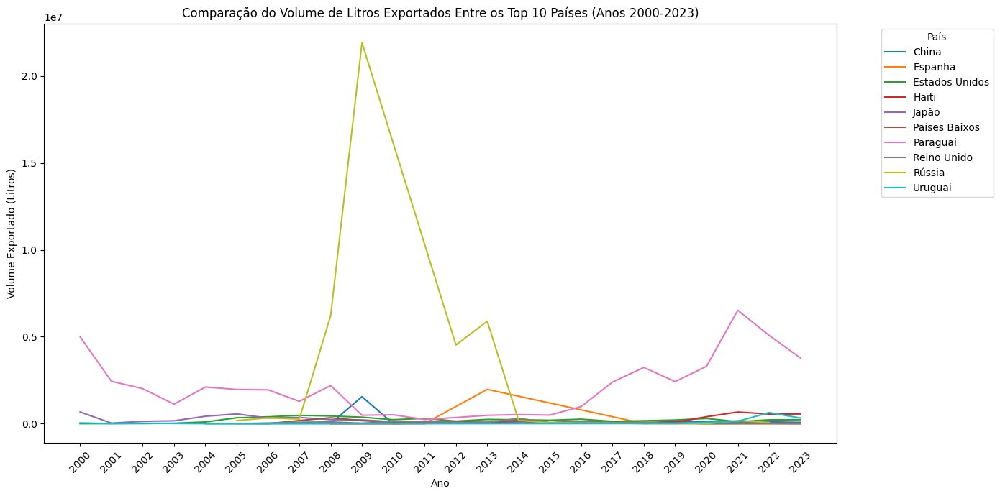

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar o DataFrame para incluir apenas os dados de litros
df_litros = df_pivotado_limpo[df_pivotado_limpo['litros'].notna() & (df_pivotado_limpo['litros'] > 0)].copy()

# Calcular o volume total em litros por país e selecionar os top 10
top_10_paises_litros = df_litros.groupby('País')['litros'].sum().sort_values(ascending=False).head(10).index.tolist()

# Filtrar o DataFrame para incluir apenas os top 10 países
df_litros_selecionados = df_litros[df_litros['País'].isin(top_10_paises_litros)]

plt.figure(figsize=(14, 7))
sns.lineplot(data=df_litros_selecionados, x='Ano', y='litros', hue='País')
plt.title('Comparação do Volume de Litros Exportados Entre os Top 10 Países (Anos 2000-2023)')
plt.xlabel('Ano')
plt.ylabel('Volume Exportado (Litros)')
plt.xticks(df_litros_selecionados['Ano'].unique(), rotation=45) # Rotate x-axis labels
plt.legend(title='País', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

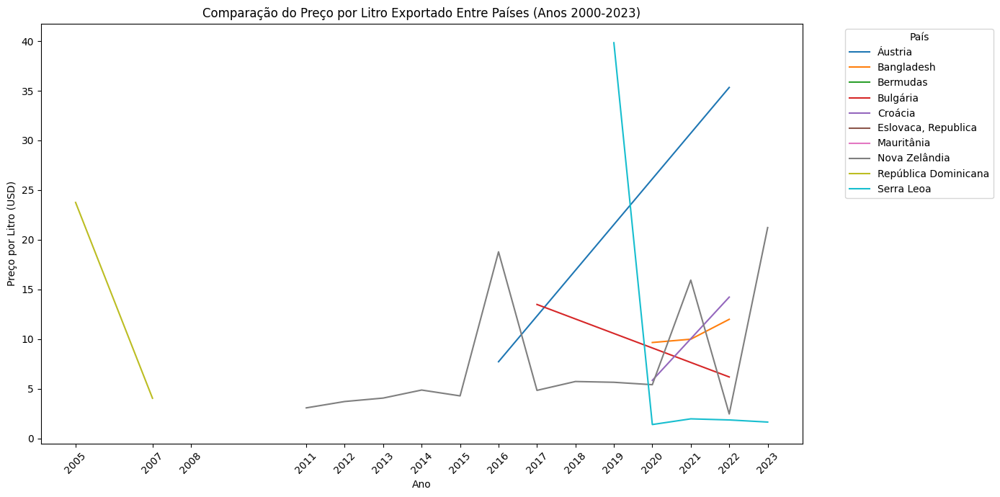

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar o DataFrame para incluir apenas os dados de preço por litro válidos
df_preco_por_litro = df_pivotado_limpo[df_pivotado_limpo['Preco_por_litro'].notna()].copy()

# Selecionar alguns países para visualização (você pode ajustar a lista)
# Usando os 10 países com maior preço médio por litro para este exemplo
paises_por_preco_medio = df_preco_por_litro.groupby('País')['Preco_por_litro'].mean().sort_values(ascending=False).head(10).index.tolist()

df_preco_por_litro_selecionados = df_preco_por_litro[df_preco_por_litro['País'].isin(paises_por_preco_medio)]


plt.figure(figsize=(14, 7))
sns.lineplot(data=df_preco_por_litro_selecionados, x='Ano', y='Preco_por_litro', hue='País')
plt.title('Comparação do Preço por Litro Exportado Entre Países (Anos 2000-2023)')
plt.xlabel('Ano')
plt.ylabel('Preço por Litro (USD)')
plt.xticks(df_preco_por_litro_selecionados['Ano'].unique(), rotation=45) # Rotate x-axis labels
plt.legend(title='País', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

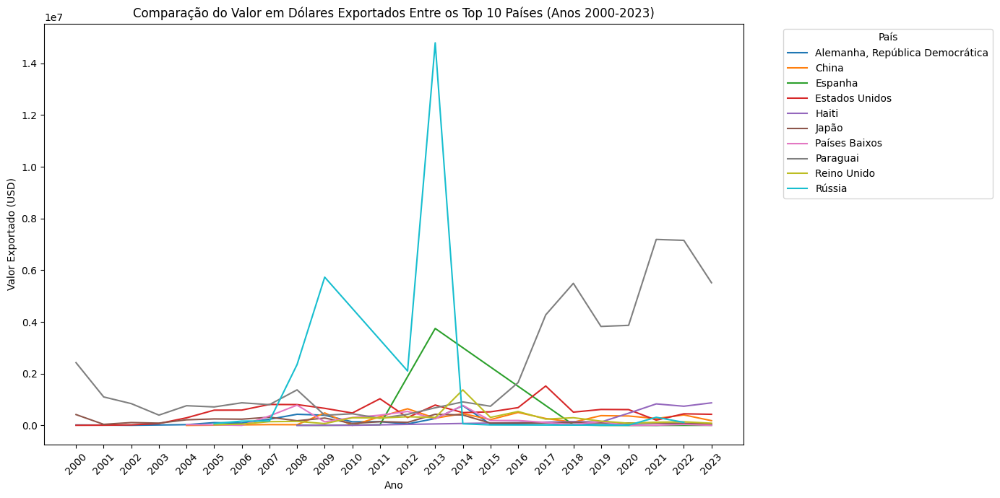

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar o DataFrame para incluir apenas os dados de dólares
df_dolares = df_pivotado_limpo[df_pivotado_limpo['dolares'].notna() & (df_pivotado_limpo['dolares'] > 0)].copy()

# Calcular o volume total em dólares por país e selecionar os top 10
top_10_paises_dolares = df_dolares.groupby('País')['dolares'].sum().sort_values(ascending=False).head(10).index.tolist()

# Filtrar o DataFrame para incluir apenas os top 10 países
df_dolares_selecionados = df_dolares[df_dolares['País'].isin(top_10_paises_dolares)]

plt.figure(figsize=(14, 7))
sns.lineplot(data=df_dolares_selecionados, x='Ano', y='dolares', hue='País')
plt.title('Comparação do Valor em Dólares Exportados Entre os Top 10 Países (Anos 2000-2023)')
plt.xlabel('Ano')
plt.ylabel('Valor Exportado (USD)')
plt.xticks(df_dolares_selecionados['Ano'].unique(), rotation=45) # Rotate x-axis labels
plt.legend(title='País', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Task
Analyze the evolution of export volume (liters) and value (USD) over the years for each country in the dataset "/content/Exportacao.csv". The analysis should include loading the data, filtering out years before 2000, renaming columns to 'year_liters' and 'year_dollars', calculating basic statistics per country, and generating line plots showing the trend for each country. The response should be in Brazilian Portuguese.

## Reestruturar os dados

### Subtask:
Transformar o DataFrame de formato largo para longo, onde cada linha representará um país, um ano e os respectivos valores de litros e dólares exportados.


**Reasoning**:
Transform the filtered dataframe from wide to long format using the melt function, then create new columns for year and type of measure, and finally display the head of the resulting dataframe.



In [16]:
df_exportacao_longo = df_exportacao_filtrado.melt(
    id_vars=['Id', 'País'],
    var_name='Ano_Medida',
    value_name='Valor'
)

df_exportacao_longo['Ano'] = df_exportacao_longo['Ano_Medida'].apply(lambda x: int(x.split('_')[0]))
df_exportacao_longo['Tipo'] = df_exportacao_longo['Ano_Medida'].apply(lambda x: x.split('_')[1])

df_exportacao_longo.drop(columns=['Ano_Medida'], inplace=True)

display(df_exportacao_longo.head())

,Id,País,Valor,Ano,Tipo
0,1,Afeganistão,0,2000,litros
1,2,África do Sul,0,2000,litros
2,3,"Alemanha, República Democrática",9900,2000,litros
3,4,Angola,249717,2000,litros
4,5,Anguilla,0,2000,litros


In [20]:
df_exportacao_longo.sort_values(by=['País', 'Ano'], inplace=True)
display(df_exportacao_longo.head())

,Id,País,Valor,Ano,Tipo
0,1,Afeganistão,0,2000,litros
137,1,Afeganistão,0,2000,dolares
274,1,Afeganistão,0,2001,litros
411,1,Afeganistão,0,2001,dolares
548,1,Afeganistão,0,2002,litros


## Calcular preço por litro por país e ano

### Subtask:
Calcular o preço médio por litro para cada país em cada ano, dividindo o valor exportado (dólares) pelo volume exportado (litros).

In [21]:
# Pivotar o DataFrame para ter litros e dolares em colunas separadas
df_pivotado = df_exportacao_longo.pivot_table(
    index=['Id', 'País', 'Ano'],
    columns='Tipo',
    values='Valor'
).reset_index()

# Calcular o preço por litro (dolares / litros)
# Evitar divisão por zero substituindo 0 litros por NaN temporariamente para o cálculo
df_pivotado['Preco_por_litro'] = df_pivotado['dolares'] / df_pivotado['litros'].replace(0, pd.NA)

# Exibir a nova tabela com o preço por litro
display(df_pivotado.head())

Tipo,Id,País,Ano,dolares,litros,Preco_por_litro
0,1,Afeganistão,2000,0.0,0.0,<NA>
1,1,Afeganistão,2001,0.0,0.0,<NA>
2,1,Afeganistão,2002,0.0,0.0,<NA>
3,1,Afeganistão,2003,0.0,0.0,<NA>
4,1,Afeganistão,2004,0.0,0.0,<NA>


## Visualizar a evolução por país

### Subtask:
Gerar gráficos de linha separados para cada país, mostrando a evolução dos volumes (litros) e valores (dólares) ao longo dos anos.


**Reasoning**:
Import the necessary libraries for plotting and get the unique list of countries to iterate through.



In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

paises = df_exportacao_longo['País'].unique()

**Reasoning**:
Iterate through each country and generate a line plot showing the evolution of liters and dollars over the years.



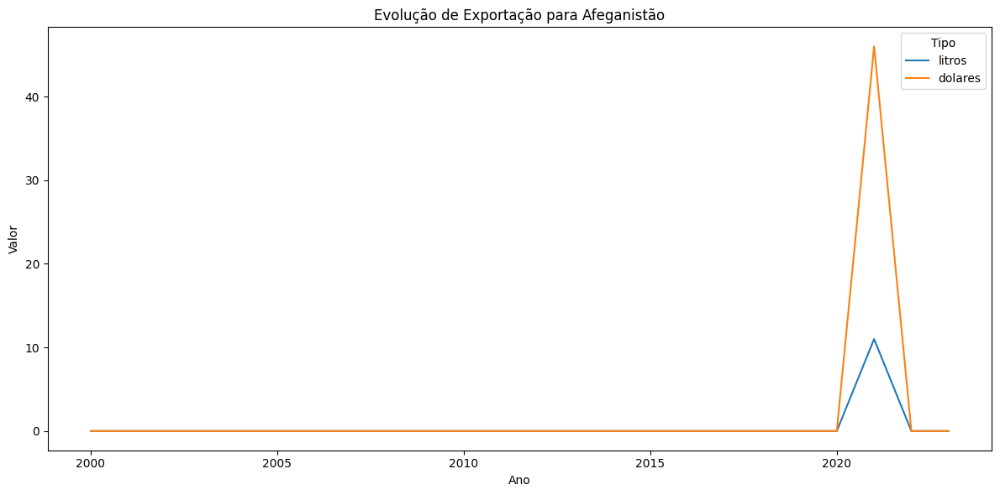

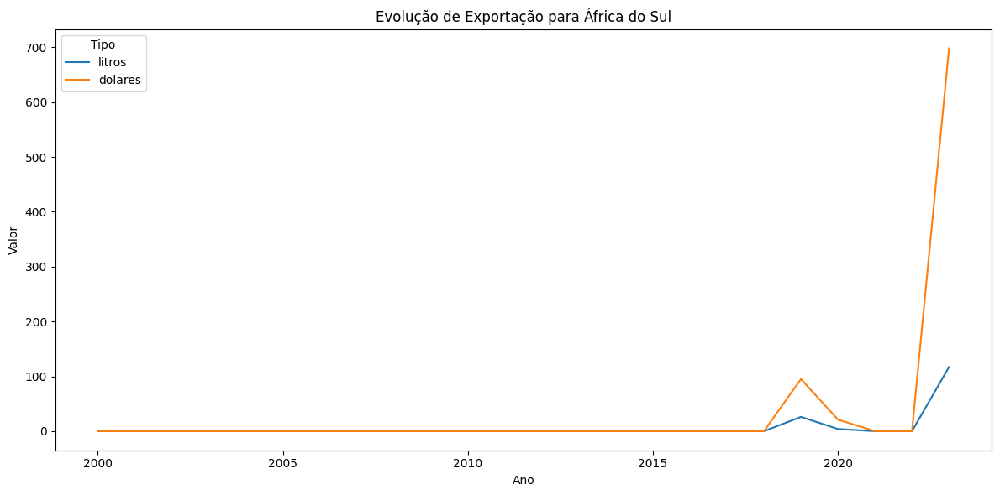

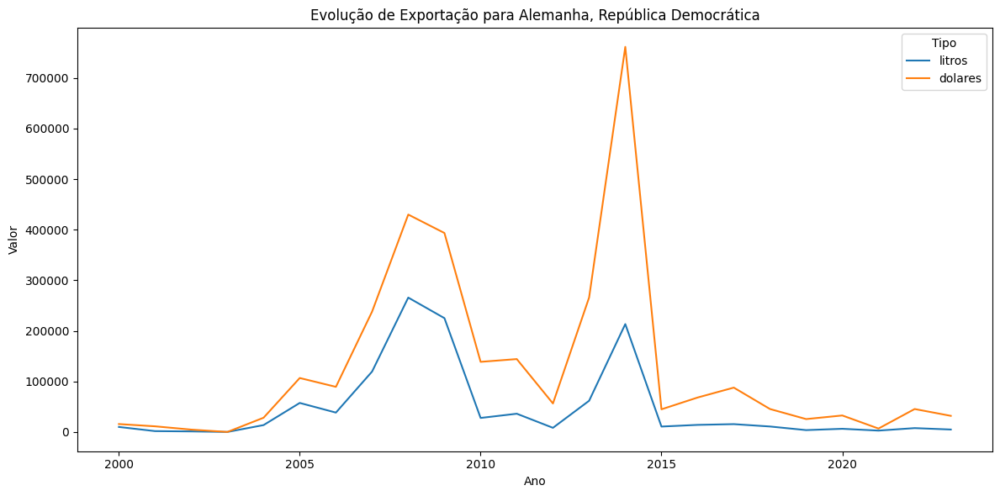

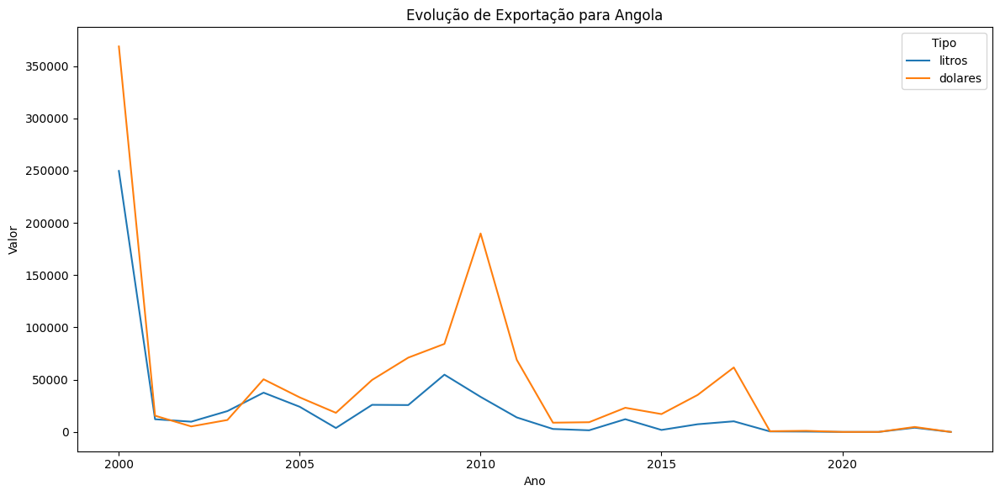

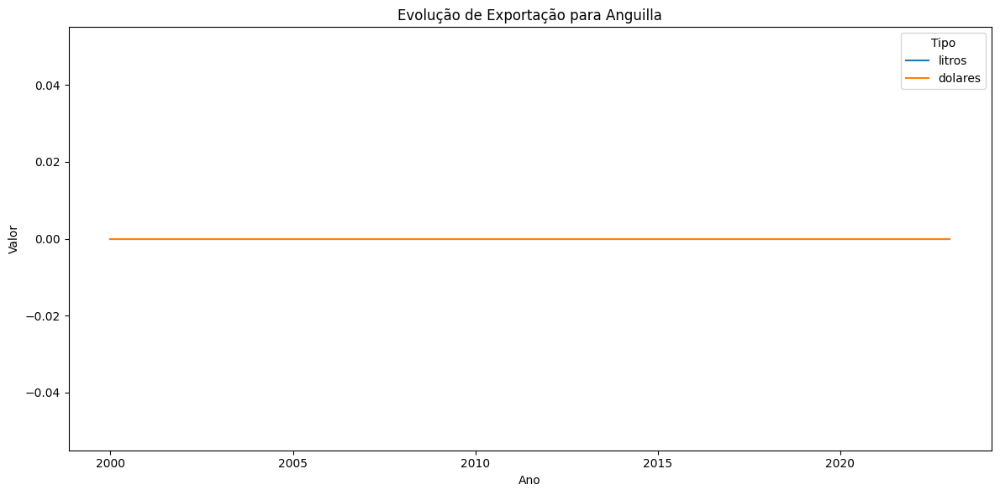

...

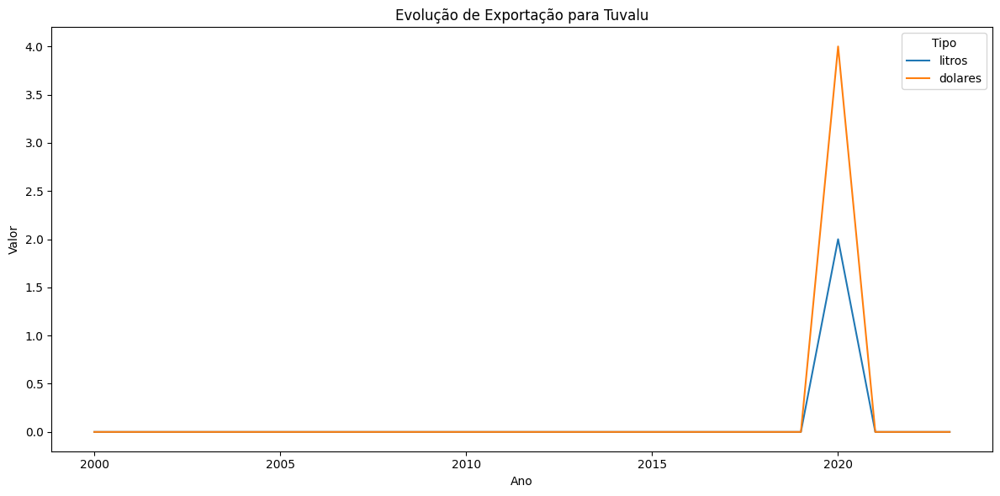

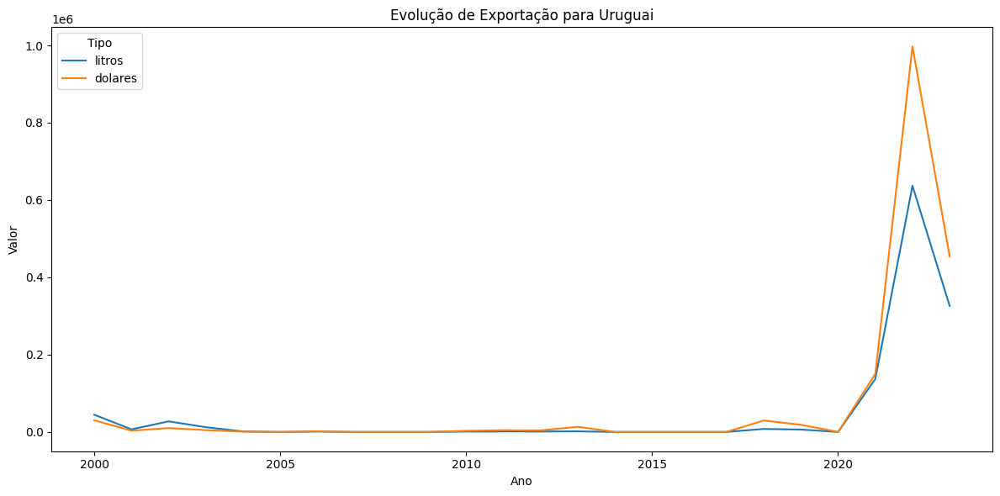

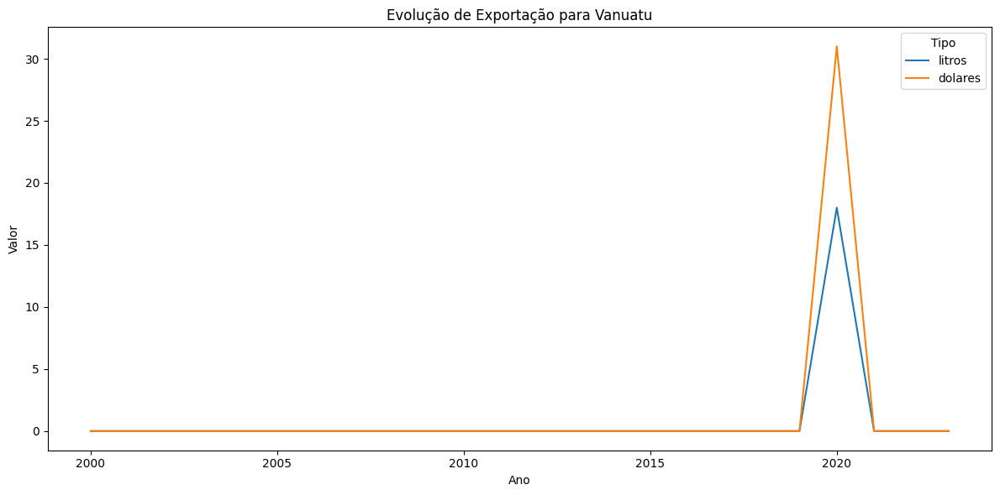

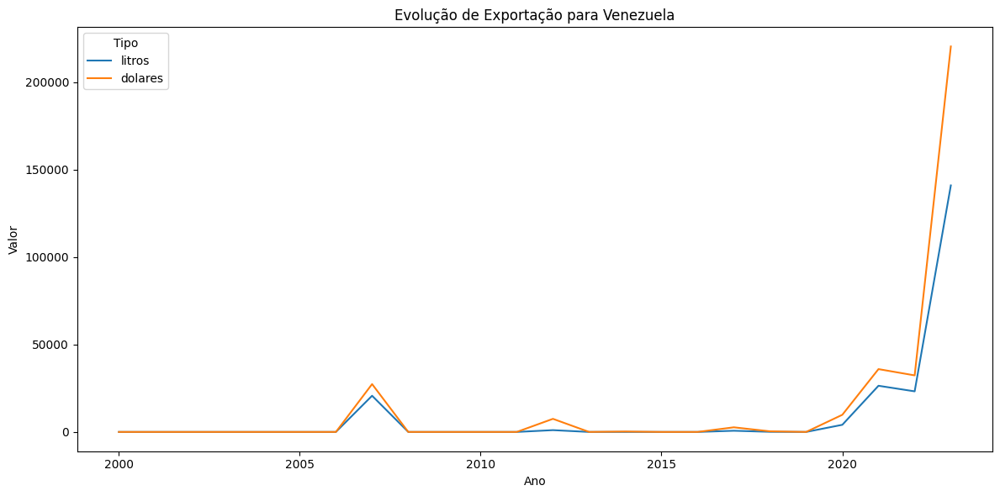

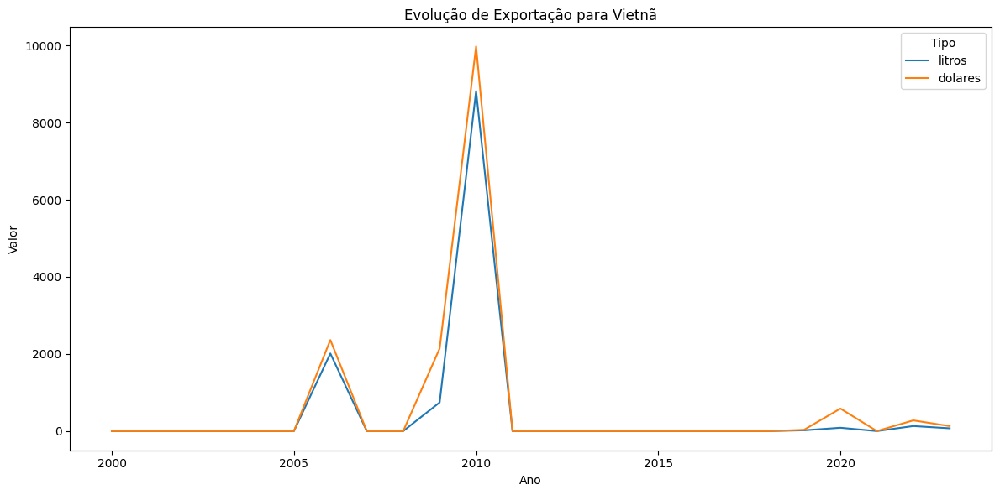

In [18]:
for pais in paises:
    df_pais = df_exportacao_longo[df_exportacao_longo['País'] == pais]

    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_pais, x='Ano', y='Valor', hue='Tipo')
    plt.title(f'Evolução de Exportação para {pais}')
    plt.xlabel('Ano')
    plt.ylabel('Valor')
    plt.legend(title='Tipo')
    plt.tight_layout()
    plt.show()

## Summary:

### Data Analysis Key Findings

* The data was successfully restructured from a wide to a long format, making it suitable for time-series analysis.
* The export volume (liters) and value (dollars) for each country over the years were successfully visualized using line plots.
* The plots clearly show the trend of exports for each country, differentiating between volume and value.

### Insights or Next Steps

* Analyze specific countries with interesting trends (e.g., significant increases or decreases in export volume or value) to understand the underlying reasons.
* Calculate the average price per liter for each country over the years to gain further insights into pricing strategies and market dynamics.


In [22]:
# Calcular o preço médio por litro por país ao longo dos anos
preco_medio_por_pais = df_pivotado.groupby('País')['Preco_por_litro'].mean().reset_index()

# Renomear a coluna para clareza
preco_medio_por_pais.rename(columns={'Preco_por_litro': 'Preco_Medio_por_Litro'}, inplace=True)

# Exibir o resultado
display(preco_medio_por_pais.head())

,País,Preco_Medio_por_Litro
0,Afeganistão,4.181818
1,"Alemanha, República Democrática",4.090201
2,Angola,3.085648
3,Anguilla,NaN
4,Antilhas Holandesas,1.436635


In [23]:
df_pivotado

Tipo,Id,País,Ano,dolares,litros,Preco_por_litro
0,1,Afeganistão,2000,0.0,0.0,<NA>
1,1,Afeganistão,2001,0.0,0.0,<NA>
2,1,Afeganistão,2002,0.0,0.0,<NA>
3,1,Afeganistão,2003,0.0,0.0,<NA>
4,1,Afeganistão,2004,0.0,0.0,<NA>
...,...,...,...,...,...,...
3283,137,Vietnã,2019,32.0,20.0,1.6
3284,137,Vietnã,2020,584.0,86.0,6.790698
3285,137,Vietnã,2021,0.0,0.0,<NA>
3286,137,Vietnã,2022,277.0,130.0,2.130769


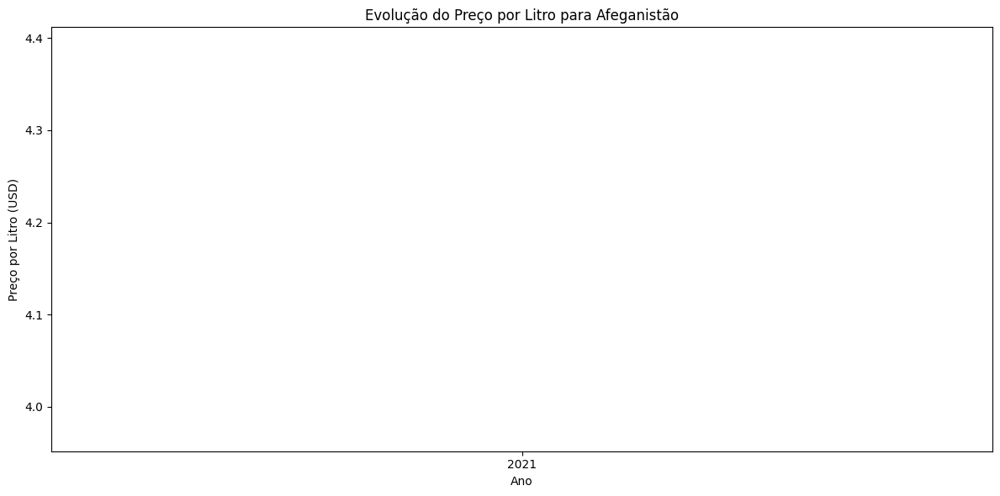

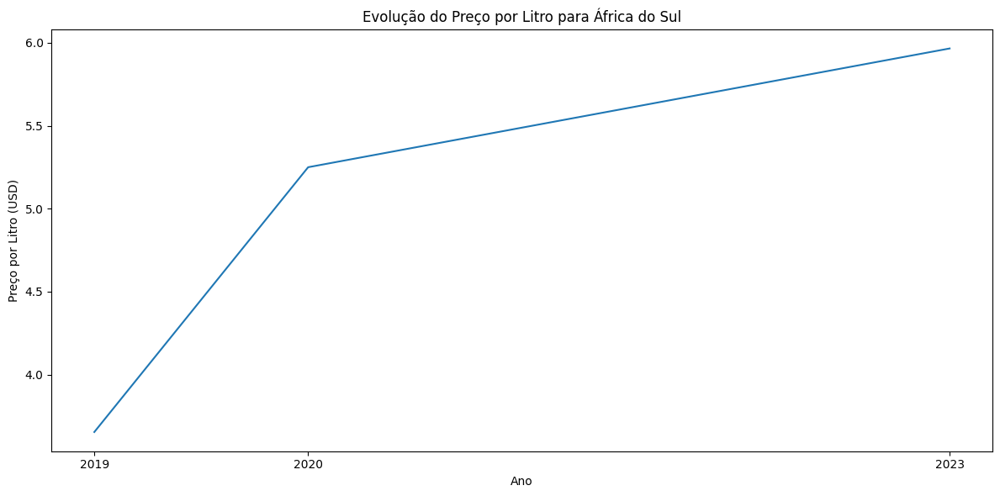

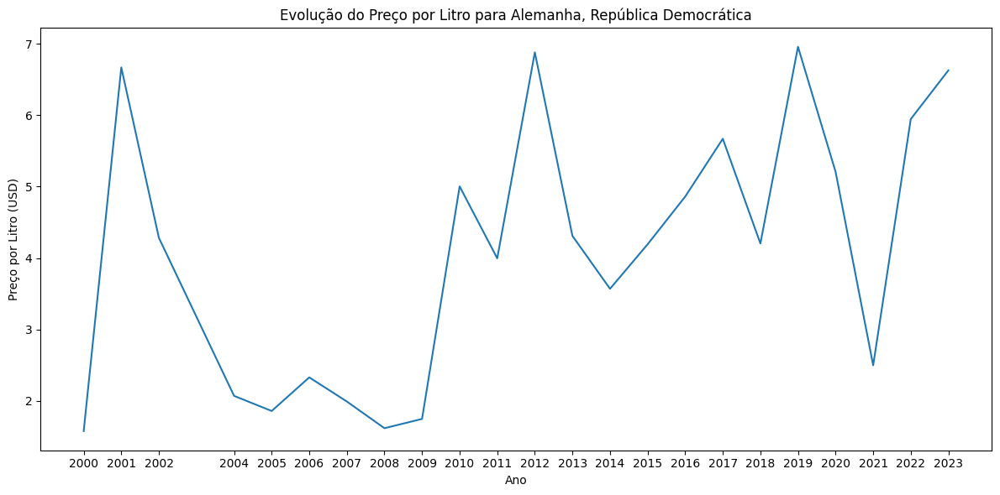

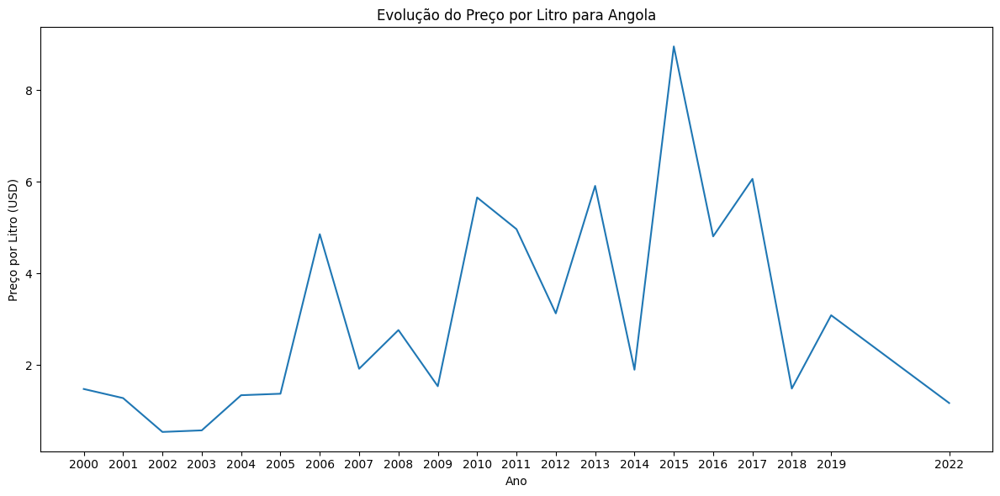

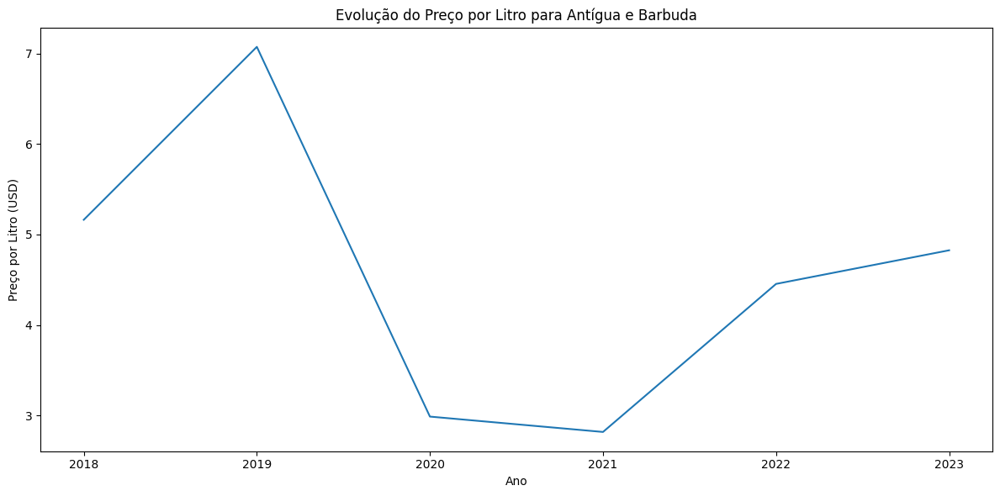

...

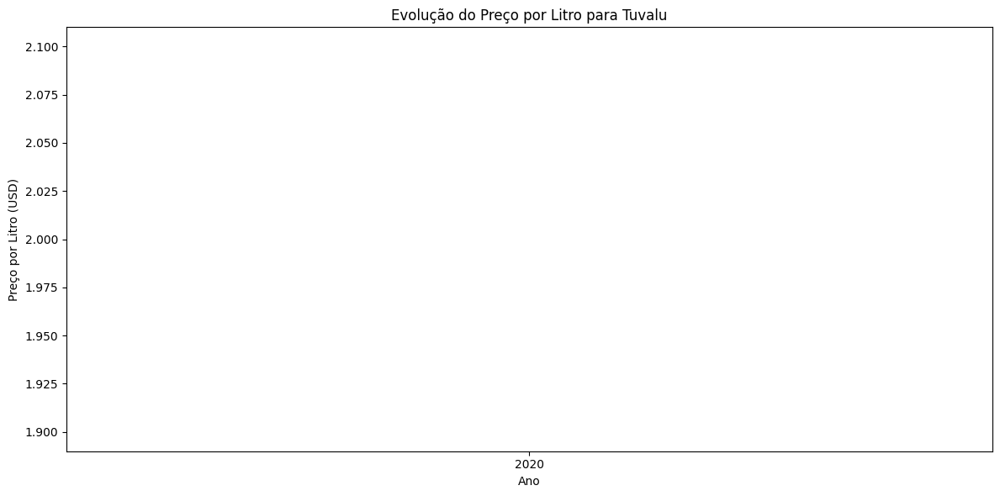

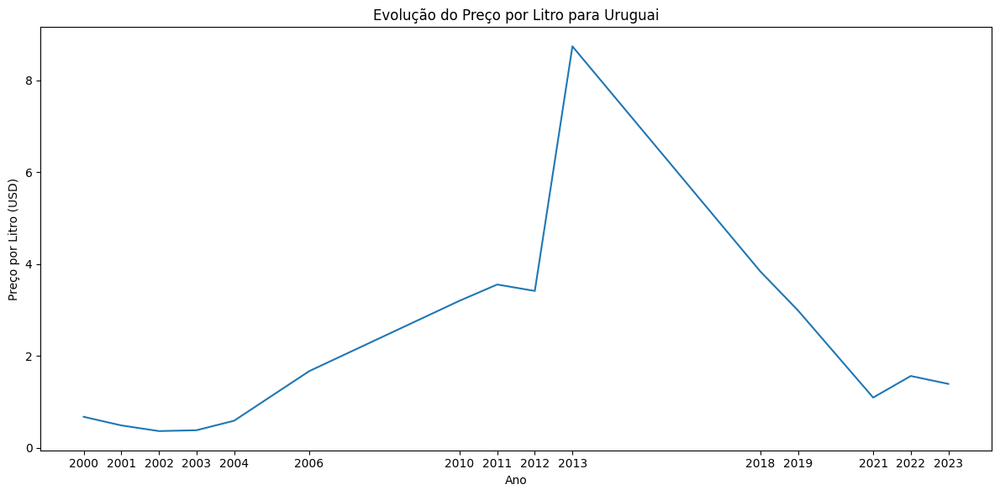

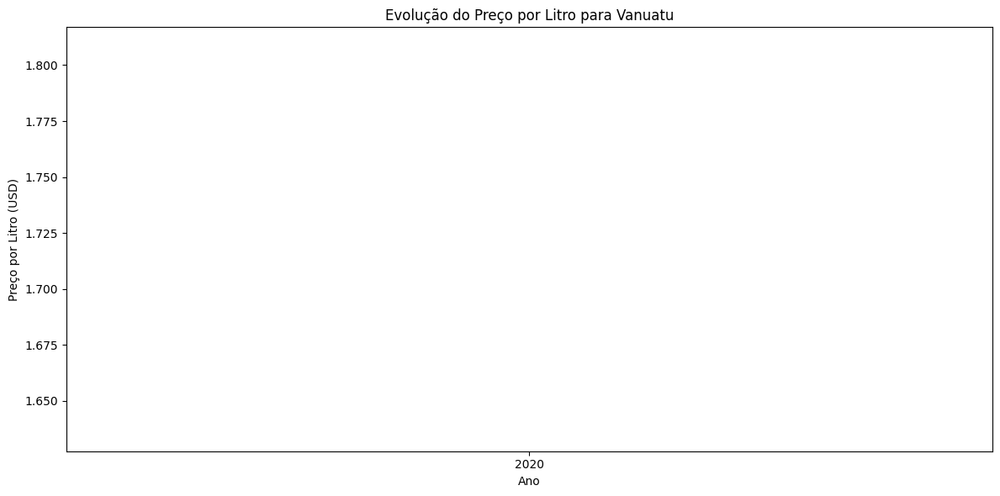

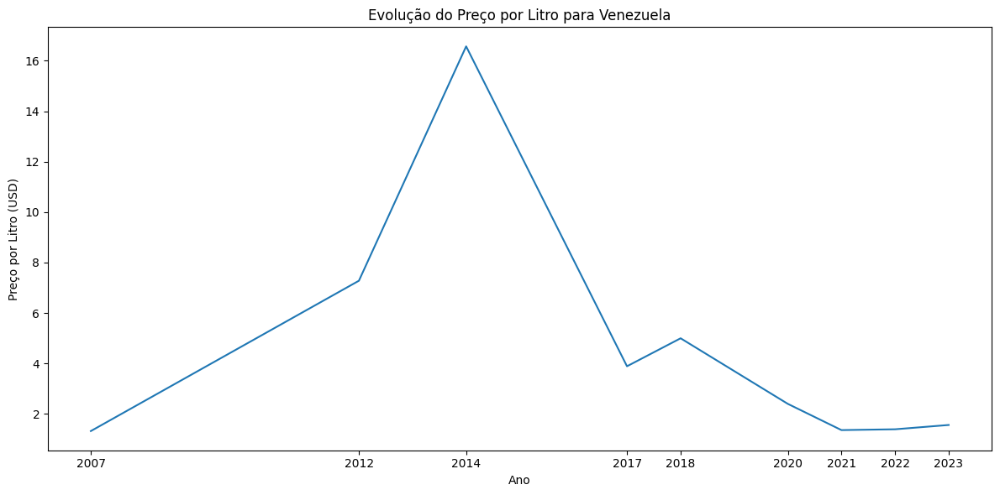

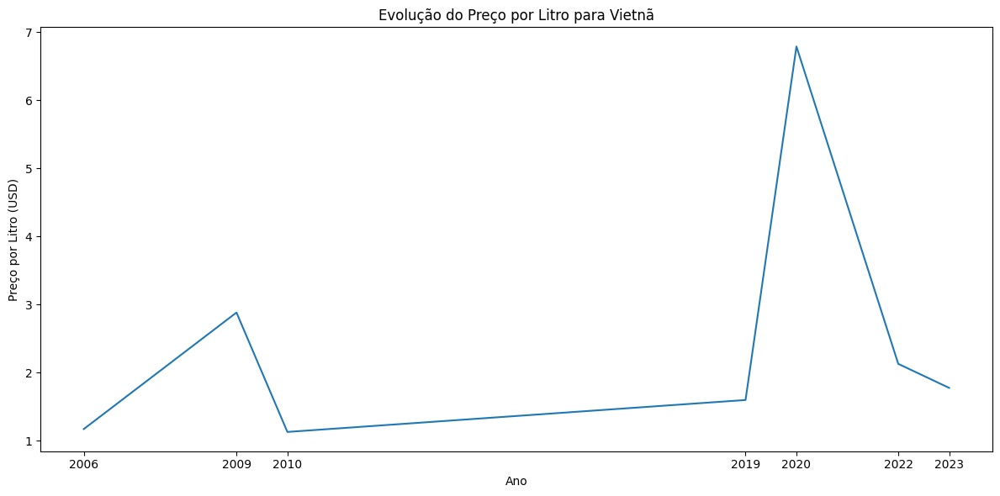

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# Obter a lista única de países do dataframe limpo
paises_pivot_limpo = df_pivotado_limpo['País'].unique()

# Gerar um gráfico de linha para cada país
for pais in paises_pivot_limpo:
    # Filtrar o dataframe limpo para o país atual e remover NaNs na coluna 'Preco_por_litro'
    df_pais_pivot_limpo = df_pivotado_limpo[df_pivotado_limpo['País'] == pais].dropna(subset=['Preco_por_litro'])

    if not df_pais_pivot_limpo.empty:
        plt.figure(figsize=(12, 6))
        sns.lineplot(data=df_pais_pivot_limpo, x='Ano', y='Preco_por_litro')
        plt.title(f'Evolução do Preço por Litro para {pais}')
        plt.xlabel('Ano')
        plt.ylabel('Preço por Litro (USD)')
        plt.xticks(df_pais_pivot_limpo['Ano']) # Explicitly set x-axis ticks to the years
        plt.tight_layout()
        plt.show()
    else:
        print(f'Não há dados de preço por litro para {pais} para plotar.')